In [1]:
import numpy as np
from obspy import read
from matplotlib import pyplot as plt
from scipy import signal
import math

In [2]:
# specify the time window length, the overlap fraction, and taper type and fraction
# unit: second
win_len = 60
# range from 0 to 1
noverlap = 0.95
# taper type and fraction
win_type = 'tukey'
win_frac = 0.05

# specify the file which contains the (daily) data
# now use SAC format
# maybe not very efficient
seisfile = 'BC.1001.01.BHZ.D.20180080108000000.sac'
tr = read(seisfile)[0]

# whether to remove the instrument response: True, or not: False
remove = True

# the response file is useless by far, and the pole zero infomation should be given manually
if remove:
    respfile = 'EPS2-M6Q.pz'
    poles = np.array([-1.848000E+02+0.0j, 
                      -5.342000E+00+0.0j, 
                      -9.621000E-01+0.0j, 
                      -6.394000E-01+0.0j])
    zeros = np.array([0.0j, 
                      0.0j, 
                      -1.850000E+02+0.0j, 
                      -5.989000E+00+0.0j])
    const = 1.241464E+10
    
# need to apply a zero-phase bandpass filter?
bpfilt = True
if bpfilt:
    f_min = 0.2
    f_max = 90
    order = 2

In [3]:
# pass data and headers into variables
fs = int(tr.stats.sampling_rate)
dt = 1. / fs
npts = tr.stats.npts
x1 = tr.data
ts = tr.stats.starttime
te = tr.stats.endtime

# calculate the step length of sliding window
hopsize = round(win_len*(1-noverlap)*fs)
winsize = round(win_len*fs)

In [4]:
# define a function to get the response of frequency
if remove:
    def resp(freq):
        pi = np.pi
        F = np.array([])
        for f in freq:
            F = np.append(F, [const * np.prod(2j*pi*f - zeros) / np.prod(2j*pi*f - poles)])
        return F

In [5]:
# define the zerophase bandpass filter
if bpfilt:
    from scipy.signal import butter, filtfilt

    def butter_bandpass(lowcut, highcut, fs, order=2):
        nyq = 0.5 * fs
        low = lowcut / nyq
        high = highcut / nyq
        b, a = butter(order, [low, high], btype='band')
        return b, a

    def butter_bandpass_filter(data, lowcut, highcut, fs, order=2):
        b, a = butter_bandpass(lowcut, highcut, fs, order=order)
        y = filtfilt(b, a, data)
        return y

In [6]:
# given the frequency sampling rate and the window size
# the frequency vector could be derived
nfft = 2**math.ceil(math.log(winsize)/math.log(2))
freq_vec = np.linspace(0, fs/2, nfft//2+1)
# setting pz[0] to be a small value (e.g. 1) or constant doesn't matter if further bandpass exists
if remove:
    pz = resp(freq_vec)
    pz[0] = const

# loop for each segment
# here use numpy.fft.rfft funtion
# scipy.signal.periodogram has similar function to calculate PSD
i = 0 ; time_vec = np.array([])
while (i*hopsize+winsize <= npts):
    
    # raw data
    x_seg = x1[i*hopsize:i*hopsize+winsize]
    # remove mean
    x_seg = x_seg - np.mean(x_seg)
    # taper at two sides
    window = signal.get_window((win_type, win_frac), winsize)
    x_seg = np.multiply(x_seg, window)
    
    # 
    if remove:
        x_seg = np.fft.irfft(np.divide(np.fft.rfft(x_seg, nfft), pz), winsize)
    
    # if the bandrange close to the bandwidth of instrument, then the waveforms should be similar
    if bpfilt:
        x_seg = x_seg - np.mean(x_seg)
        x_seg = butter_bandpass_filter(x_seg, f_min, f_max, fs, order)
        # (is there a need to remove the side effects? and how?)
    
    # use fft to compute the power spectral density
    Pxx_den = np.abs(np.fft.rfft(x_seg, nfft))**2 * 2 * dt / nfft
    # or use this: 
    #tempf, scipyP = signal.periodogram(x_seg, fs)
    # their result are nealy identical!
    # unless that for frequency=0, the psd value is very small for the latter
    
    # regard the middle point's time of each segment as a timestamp
    time_vec = np.append(time_vec, [(i*hopsize+winsize/2.) * dt / 3600.])
    print((i*hopsize+winsize/2.) * dt, 's')
    # save all psd vectors into the matrix: Pxx
    if i == 0:
        Pxx = Pxx_den
    else:
        Pxx = np.vstack((Pxx, Pxx_den))
    i += 1
    
# transposition so the first dimension corresponds to frequency vector
# and the second dimension corresponds to time vector
Pxx = Pxx.T

30.0 s
33.0 s
36.0 s
39.0 s
42.0 s
45.0 s
48.0 s
51.0 s
54.0 s
57.0 s
60.0 s
63.0 s
66.0 s
69.0 s
72.0 s
75.0 s
78.0 s
81.0 s
84.0 s
87.0 s
90.0 s
93.0 s
96.0 s
99.0 s
102.0 s
105.0 s
108.0 s
111.0 s
114.0 s
117.0 s
120.0 s
123.0 s
126.0 s
129.0 s
132.0 s
135.0 s
138.0 s
141.0 s
144.0 s
147.0 s
150.0 s
153.0 s
156.0 s
159.0 s
162.0 s
165.0 s
168.0 s
171.0 s
174.0 s
177.0 s
180.0 s
183.0 s
186.0 s
189.0 s
192.0 s
195.0 s
198.0 s
201.0 s
204.0 s
207.0 s
210.0 s
213.0 s
216.0 s
219.0 s
222.0 s
225.0 s
228.0 s
231.0 s
234.0 s
237.0 s
240.0 s
243.0 s
246.0 s
249.0 s
252.0 s
255.0 s
258.0 s
261.0 s
264.0 s
267.0 s
270.0 s
273.0 s
276.0 s
279.0 s
282.0 s
285.0 s
288.0 s
291.0 s
294.0 s
297.0 s
300.0 s
303.0 s
306.0 s
309.0 s
312.0 s
315.0 s
318.0 s
321.0 s
324.0 s
327.0 s
330.0 s
333.0 s
336.0 s
339.0 s
342.0 s
345.0 s
348.0 s
351.0 s
354.0 s
357.0 s
360.0 s
363.0 s
366.0 s
369.0 s
372.0 s
375.0 s
378.0 s
381.0 s
384.0 s
387.0 s
390.0 s
393.0 s
396.0 s
399.0 s
402.0 s
405.0 s
408.0 s
411.0 s


2901.0 s
2904.0 s
2907.0 s
2910.0 s
2913.0 s
2916.0 s
2919.0 s
2922.0 s
2925.0 s
2928.0 s
2931.0 s
2934.0 s
2937.0 s
2940.0 s
2943.0 s
2946.0 s
2949.0 s
2952.0 s
2955.0 s
2958.0 s
2961.0 s
2964.0 s
2967.0 s
2970.0 s
2973.0 s
2976.0 s
2979.0 s
2982.0 s
2985.0 s
2988.0 s
2991.0 s
2994.0 s
2997.0 s
3000.0 s
3003.0 s
3006.0 s
3009.0 s
3012.0 s
3015.0 s
3018.0 s
3021.0 s
3024.0 s
3027.0 s
3030.0 s
3033.0 s
3036.0 s
3039.0 s
3042.0 s
3045.0 s
3048.0 s
3051.0 s
3054.0 s
3057.0 s
3060.0 s
3063.0 s
3066.0 s
3069.0 s
3072.0 s
3075.0 s
3078.0 s
3081.0 s
3084.0 s
3087.0 s
3090.0 s
3093.0 s
3096.0 s
3099.0 s
3102.0 s
3105.0 s
3108.0 s
3111.0 s
3114.0 s
3117.0 s
3120.0 s
3123.0 s
3126.0 s
3129.0 s
3132.0 s
3135.0 s
3138.0 s
3141.0 s
3144.0 s
3147.0 s
3150.0 s
3153.0 s
3156.0 s
3159.0 s
3162.0 s
3165.0 s
3168.0 s
3171.0 s
3174.0 s
3177.0 s
3180.0 s
3183.0 s
3186.0 s
3189.0 s
3192.0 s
3195.0 s
3198.0 s
3201.0 s
3204.0 s
3207.0 s
3210.0 s
3213.0 s
3216.0 s
3219.0 s
3222.0 s
3225.0 s
3228.0 s
3231.0 s
3

5637.0 s
5640.0 s
5643.0 s
5646.0 s
5649.0 s
5652.0 s
5655.0 s
5658.0 s
5661.0 s
5664.0 s
5667.0 s
5670.0 s
5673.0 s
5676.0 s
5679.0 s
5682.0 s
5685.0 s
5688.0 s
5691.0 s
5694.0 s
5697.0 s
5700.0 s
5703.0 s
5706.0 s
5709.0 s
5712.0 s
5715.0 s
5718.0 s
5721.0 s
5724.0 s
5727.0 s
5730.0 s
5733.0 s
5736.0 s
5739.0 s
5742.0 s
5745.0 s
5748.0 s
5751.0 s
5754.0 s
5757.0 s
5760.0 s
5763.0 s
5766.0 s
5769.0 s
5772.0 s
5775.0 s
5778.0 s
5781.0 s
5784.0 s
5787.0 s
5790.0 s
5793.0 s
5796.0 s
5799.0 s
5802.0 s
5805.0 s
5808.0 s
5811.0 s
5814.0 s
5817.0 s
5820.0 s
5823.0 s
5826.0 s
5829.0 s
5832.0 s
5835.0 s
5838.0 s
5841.0 s
5844.0 s
5847.0 s
5850.0 s
5853.0 s
5856.0 s
5859.0 s
5862.0 s
5865.0 s
5868.0 s
5871.0 s
5874.0 s
5877.0 s
5880.0 s
5883.0 s
5886.0 s
5889.0 s
5892.0 s
5895.0 s
5898.0 s
5901.0 s
5904.0 s
5907.0 s
5910.0 s
5913.0 s
5916.0 s
5919.0 s
5922.0 s
5925.0 s
5928.0 s
5931.0 s
5934.0 s
5937.0 s
5940.0 s
5943.0 s
5946.0 s
5949.0 s
5952.0 s
5955.0 s
5958.0 s
5961.0 s
5964.0 s
5967.0 s
5

8373.0 s
8376.0 s
8379.0 s
8382.0 s
8385.0 s
8388.0 s
8391.0 s
8394.0 s
8397.0 s
8400.0 s
8403.0 s
8406.0 s
8409.0 s
8412.0 s
8415.0 s
8418.0 s
8421.0 s
8424.0 s
8427.0 s
8430.0 s
8433.0 s
8436.0 s
8439.0 s
8442.0 s
8445.0 s
8448.0 s
8451.0 s
8454.0 s
8457.0 s
8460.0 s
8463.0 s
8466.0 s
8469.0 s
8472.0 s
8475.0 s
8478.0 s
8481.0 s
8484.0 s
8487.0 s
8490.0 s
8493.0 s
8496.0 s
8499.0 s
8502.0 s
8505.0 s
8508.0 s
8511.0 s
8514.0 s
8517.0 s
8520.0 s
8523.0 s
8526.0 s
8529.0 s
8532.0 s
8535.0 s
8538.0 s
8541.0 s
8544.0 s
8547.0 s
8550.0 s
8553.0 s
8556.0 s
8559.0 s
8562.0 s
8565.0 s
8568.0 s
8571.0 s
8574.0 s
8577.0 s
8580.0 s
8583.0 s
8586.0 s
8589.0 s
8592.0 s
8595.0 s
8598.0 s
8601.0 s
8604.0 s
8607.0 s
8610.0 s
8613.0 s
8616.0 s
8619.0 s
8622.0 s
8625.0 s
8628.0 s
8631.0 s
8634.0 s
8637.0 s
8640.0 s
8643.0 s
8646.0 s
8649.0 s
8652.0 s
8655.0 s
8658.0 s
8661.0 s
8664.0 s
8667.0 s
8670.0 s
8673.0 s
8676.0 s
8679.0 s
8682.0 s
8685.0 s
8688.0 s
8691.0 s
8694.0 s
8697.0 s
8700.0 s
8703.0 s
8

10995.0 s
10998.0 s
11001.0 s
11004.0 s
11007.0 s
11010.0 s
11013.0 s
11016.0 s
11019.0 s
11022.0 s
11025.0 s
11028.0 s
11031.0 s
11034.0 s
11037.0 s
11040.0 s
11043.0 s
11046.0 s
11049.0 s
11052.0 s
11055.0 s
11058.0 s
11061.0 s
11064.0 s
11067.0 s
11070.0 s
11073.0 s
11076.0 s
11079.0 s
11082.0 s
11085.0 s
11088.0 s
11091.0 s
11094.0 s
11097.0 s
11100.0 s
11103.0 s
11106.0 s
11109.0 s
11112.0 s
11115.0 s
11118.0 s
11121.0 s
11124.0 s
11127.0 s
11130.0 s
11133.0 s
11136.0 s
11139.0 s
11142.0 s
11145.0 s
11148.0 s
11151.0 s
11154.0 s
11157.0 s
11160.0 s
11163.0 s
11166.0 s
11169.0 s
11172.0 s
11175.0 s
11178.0 s
11181.0 s
11184.0 s
11187.0 s
11190.0 s
11193.0 s
11196.0 s
11199.0 s
11202.0 s
11205.0 s
11208.0 s
11211.0 s
11214.0 s
11217.0 s
11220.0 s
11223.0 s
11226.0 s
11229.0 s
11232.0 s
11235.0 s
11238.0 s
11241.0 s
11244.0 s
11247.0 s
11250.0 s
11253.0 s
11256.0 s
11259.0 s
11262.0 s
11265.0 s
11268.0 s
11271.0 s
11274.0 s
11277.0 s
11280.0 s
11283.0 s
11286.0 s
11289.0 s
11292.0 s


13455.0 s
13458.0 s
13461.0 s
13464.0 s
13467.0 s
13470.0 s
13473.0 s
13476.0 s
13479.0 s
13482.0 s
13485.0 s
13488.0 s
13491.0 s
13494.0 s
13497.0 s
13500.0 s
13503.0 s
13506.0 s
13509.0 s
13512.0 s
13515.0 s
13518.0 s
13521.0 s
13524.0 s
13527.0 s
13530.0 s
13533.0 s
13536.0 s
13539.0 s
13542.0 s
13545.0 s
13548.0 s
13551.0 s
13554.0 s
13557.0 s
13560.0 s
13563.0 s
13566.0 s
13569.0 s
13572.0 s
13575.0 s
13578.0 s
13581.0 s
13584.0 s
13587.0 s
13590.0 s
13593.0 s
13596.0 s
13599.0 s
13602.0 s
13605.0 s
13608.0 s
13611.0 s
13614.0 s
13617.0 s
13620.0 s
13623.0 s
13626.0 s
13629.0 s
13632.0 s
13635.0 s
13638.0 s
13641.0 s
13644.0 s
13647.0 s
13650.0 s
13653.0 s
13656.0 s
13659.0 s
13662.0 s
13665.0 s
13668.0 s
13671.0 s
13674.0 s
13677.0 s
13680.0 s
13683.0 s
13686.0 s
13689.0 s
13692.0 s
13695.0 s
13698.0 s
13701.0 s
13704.0 s
13707.0 s
13710.0 s
13713.0 s
13716.0 s
13719.0 s
13722.0 s
13725.0 s
13728.0 s
13731.0 s
13734.0 s
13737.0 s
13740.0 s
13743.0 s
13746.0 s
13749.0 s
13752.0 s


15915.0 s
15918.0 s
15921.0 s
15924.0 s
15927.0 s
15930.0 s
15933.0 s
15936.0 s
15939.0 s
15942.0 s
15945.0 s
15948.0 s
15951.0 s
15954.0 s
15957.0 s
15960.0 s
15963.0 s
15966.0 s
15969.0 s
15972.0 s
15975.0 s
15978.0 s
15981.0 s
15984.0 s
15987.0 s
15990.0 s
15993.0 s
15996.0 s
15999.0 s
16002.0 s
16005.0 s
16008.0 s
16011.0 s
16014.0 s
16017.0 s
16020.0 s
16023.0 s
16026.0 s
16029.0 s
16032.0 s
16035.0 s
16038.0 s
16041.0 s
16044.0 s
16047.0 s
16050.0 s
16053.0 s
16056.0 s
16059.0 s
16062.0 s
16065.0 s
16068.0 s
16071.0 s
16074.0 s
16077.0 s
16080.0 s
16083.0 s
16086.0 s
16089.0 s
16092.0 s
16095.0 s
16098.0 s
16101.0 s
16104.0 s
16107.0 s
16110.0 s
16113.0 s
16116.0 s
16119.0 s
16122.0 s
16125.0 s
16128.0 s
16131.0 s
16134.0 s
16137.0 s
16140.0 s
16143.0 s
16146.0 s
16149.0 s
16152.0 s
16155.0 s
16158.0 s
16161.0 s
16164.0 s
16167.0 s
16170.0 s
16173.0 s
16176.0 s
16179.0 s
16182.0 s
16185.0 s
16188.0 s
16191.0 s
16194.0 s
16197.0 s
16200.0 s
16203.0 s
16206.0 s
16209.0 s
16212.0 s


18375.0 s
18378.0 s
18381.0 s
18384.0 s
18387.0 s
18390.0 s
18393.0 s
18396.0 s
18399.0 s
18402.0 s
18405.0 s
18408.0 s
18411.0 s
18414.0 s
18417.0 s
18420.0 s
18423.0 s
18426.0 s
18429.0 s
18432.0 s
18435.0 s
18438.0 s
18441.0 s
18444.0 s
18447.0 s
18450.0 s
18453.0 s
18456.0 s
18459.0 s
18462.0 s
18465.0 s
18468.0 s
18471.0 s
18474.0 s
18477.0 s
18480.0 s
18483.0 s
18486.0 s
18489.0 s
18492.0 s
18495.0 s
18498.0 s
18501.0 s
18504.0 s
18507.0 s
18510.0 s
18513.0 s
18516.0 s
18519.0 s
18522.0 s
18525.0 s
18528.0 s
18531.0 s
18534.0 s
18537.0 s
18540.0 s
18543.0 s
18546.0 s
18549.0 s
18552.0 s
18555.0 s
18558.0 s
18561.0 s
18564.0 s
18567.0 s
18570.0 s
18573.0 s
18576.0 s
18579.0 s
18582.0 s
18585.0 s
18588.0 s
18591.0 s
18594.0 s
18597.0 s
18600.0 s
18603.0 s
18606.0 s
18609.0 s
18612.0 s
18615.0 s
18618.0 s
18621.0 s
18624.0 s
18627.0 s
18630.0 s
18633.0 s
18636.0 s
18639.0 s
18642.0 s
18645.0 s
18648.0 s
18651.0 s
18654.0 s
18657.0 s
18660.0 s
18663.0 s
18666.0 s
18669.0 s
18672.0 s


20838.0 s
20841.0 s
20844.0 s
20847.0 s
20850.0 s
20853.0 s
20856.0 s
20859.0 s
20862.0 s
20865.0 s
20868.0 s
20871.0 s
20874.0 s
20877.0 s
20880.0 s
20883.0 s
20886.0 s
20889.0 s
20892.0 s
20895.0 s
20898.0 s
20901.0 s
20904.0 s
20907.0 s
20910.0 s
20913.0 s
20916.0 s
20919.0 s
20922.0 s
20925.0 s
20928.0 s
20931.0 s
20934.0 s
20937.0 s
20940.0 s
20943.0 s
20946.0 s
20949.0 s
20952.0 s
20955.0 s
20958.0 s
20961.0 s
20964.0 s
20967.0 s
20970.0 s
20973.0 s
20976.0 s
20979.0 s
20982.0 s
20985.0 s
20988.0 s
20991.0 s
20994.0 s
20997.0 s
21000.0 s
21003.0 s
21006.0 s
21009.0 s
21012.0 s
21015.0 s
21018.0 s
21021.0 s
21024.0 s
21027.0 s
21030.0 s
21033.0 s
21036.0 s
21039.0 s
21042.0 s
21045.0 s
21048.0 s
21051.0 s
21054.0 s
21057.0 s
21060.0 s
21063.0 s
21066.0 s
21069.0 s
21072.0 s
21075.0 s
21078.0 s
21081.0 s
21084.0 s
21087.0 s
21090.0 s
21093.0 s
21096.0 s
21099.0 s
21102.0 s
21105.0 s
21108.0 s
21111.0 s
21114.0 s
21117.0 s
21120.0 s
21123.0 s
21126.0 s
21129.0 s
21132.0 s
21135.0 s


23298.0 s
23301.0 s
23304.0 s
23307.0 s
23310.0 s
23313.0 s
23316.0 s
23319.0 s
23322.0 s
23325.0 s
23328.0 s
23331.0 s
23334.0 s
23337.0 s
23340.0 s
23343.0 s
23346.0 s
23349.0 s
23352.0 s
23355.0 s
23358.0 s
23361.0 s
23364.0 s
23367.0 s
23370.0 s
23373.0 s
23376.0 s
23379.0 s
23382.0 s
23385.0 s
23388.0 s
23391.0 s
23394.0 s
23397.0 s
23400.0 s
23403.0 s
23406.0 s
23409.0 s
23412.0 s
23415.0 s
23418.0 s
23421.0 s
23424.0 s
23427.0 s
23430.0 s
23433.0 s
23436.0 s
23439.0 s
23442.0 s
23445.0 s
23448.0 s
23451.0 s
23454.0 s
23457.0 s
23460.0 s
23463.0 s
23466.0 s
23469.0 s
23472.0 s
23475.0 s
23478.0 s
23481.0 s
23484.0 s
23487.0 s
23490.0 s
23493.0 s
23496.0 s
23499.0 s
23502.0 s
23505.0 s
23508.0 s
23511.0 s
23514.0 s
23517.0 s
23520.0 s
23523.0 s
23526.0 s
23529.0 s
23532.0 s
23535.0 s
23538.0 s
23541.0 s
23544.0 s
23547.0 s
23550.0 s
23553.0 s
23556.0 s
23559.0 s
23562.0 s
23565.0 s
23568.0 s
23571.0 s
23574.0 s
23577.0 s
23580.0 s
23583.0 s
23586.0 s
23589.0 s
23592.0 s
23595.0 s


25758.0 s
25761.0 s
25764.0 s
25767.0 s
25770.0 s
25773.0 s
25776.0 s
25779.0 s
25782.0 s
25785.0 s
25788.0 s
25791.0 s
25794.0 s
25797.0 s
25800.0 s
25803.0 s
25806.0 s
25809.0 s
25812.0 s
25815.0 s
25818.0 s
25821.0 s
25824.0 s
25827.0 s
25830.0 s
25833.0 s
25836.0 s
25839.0 s
25842.0 s
25845.0 s
25848.0 s
25851.0 s
25854.0 s
25857.0 s
25860.0 s
25863.0 s
25866.0 s
25869.0 s
25872.0 s
25875.0 s
25878.0 s
25881.0 s
25884.0 s
25887.0 s
25890.0 s
25893.0 s
25896.0 s
25899.0 s
25902.0 s
25905.0 s
25908.0 s
25911.0 s
25914.0 s
25917.0 s
25920.0 s
25923.0 s
25926.0 s
25929.0 s
25932.0 s
25935.0 s
25938.0 s
25941.0 s
25944.0 s
25947.0 s
25950.0 s
25953.0 s
25956.0 s
25959.0 s
25962.0 s
25965.0 s
25968.0 s
25971.0 s
25974.0 s
25977.0 s
25980.0 s
25983.0 s
25986.0 s
25989.0 s
25992.0 s
25995.0 s
25998.0 s
26001.0 s
26004.0 s
26007.0 s
26010.0 s
26013.0 s
26016.0 s
26019.0 s
26022.0 s
26025.0 s
26028.0 s
26031.0 s
26034.0 s
26037.0 s
26040.0 s
26043.0 s
26046.0 s
26049.0 s
26052.0 s
26055.0 s


28218.0 s
28221.0 s
28224.0 s
28227.0 s
28230.0 s
28233.0 s
28236.0 s
28239.0 s
28242.0 s
28245.0 s
28248.0 s
28251.0 s
28254.0 s
28257.0 s
28260.0 s
28263.0 s
28266.0 s
28269.0 s
28272.0 s
28275.0 s
28278.0 s
28281.0 s
28284.0 s
28287.0 s
28290.0 s
28293.0 s
28296.0 s
28299.0 s
28302.0 s
28305.0 s
28308.0 s
28311.0 s
28314.0 s
28317.0 s
28320.0 s
28323.0 s
28326.0 s
28329.0 s
28332.0 s
28335.0 s
28338.0 s
28341.0 s
28344.0 s
28347.0 s
28350.0 s
28353.0 s
28356.0 s
28359.0 s
28362.0 s
28365.0 s
28368.0 s
28371.0 s
28374.0 s
28377.0 s
28380.0 s
28383.0 s
28386.0 s
28389.0 s
28392.0 s
28395.0 s
28398.0 s
28401.0 s
28404.0 s
28407.0 s
28410.0 s
28413.0 s
28416.0 s
28419.0 s
28422.0 s
28425.0 s
28428.0 s
28431.0 s
28434.0 s
28437.0 s
28440.0 s
28443.0 s
28446.0 s
28449.0 s
28452.0 s
28455.0 s
28458.0 s
28461.0 s
28464.0 s
28467.0 s
28470.0 s
28473.0 s
28476.0 s
28479.0 s
28482.0 s
28485.0 s
28488.0 s
28491.0 s
28494.0 s
28497.0 s
28500.0 s
28503.0 s
28506.0 s
28509.0 s
28512.0 s
28515.0 s


30678.0 s
30681.0 s
30684.0 s
30687.0 s
30690.0 s
30693.0 s
30696.0 s
30699.0 s
30702.0 s
30705.0 s
30708.0 s
30711.0 s
30714.0 s
30717.0 s
30720.0 s
30723.0 s
30726.0 s
30729.0 s
30732.0 s
30735.0 s
30738.0 s
30741.0 s
30744.0 s
30747.0 s
30750.0 s
30753.0 s
30756.0 s
30759.0 s
30762.0 s
30765.0 s
30768.0 s
30771.0 s
30774.0 s
30777.0 s
30780.0 s
30783.0 s
30786.0 s
30789.0 s
30792.0 s
30795.0 s
30798.0 s
30801.0 s
30804.0 s
30807.0 s
30810.0 s
30813.0 s
30816.0 s
30819.0 s
30822.0 s
30825.0 s
30828.0 s
30831.0 s
30834.0 s
30837.0 s
30840.0 s
30843.0 s
30846.0 s
30849.0 s
30852.0 s
30855.0 s
30858.0 s
30861.0 s
30864.0 s
30867.0 s
30870.0 s
30873.0 s
30876.0 s
30879.0 s
30882.0 s
30885.0 s
30888.0 s
30891.0 s
30894.0 s
30897.0 s
30900.0 s
30903.0 s
30906.0 s
30909.0 s
30912.0 s
30915.0 s
30918.0 s
30921.0 s
30924.0 s
30927.0 s
30930.0 s
30933.0 s
30936.0 s
30939.0 s
30942.0 s
30945.0 s
30948.0 s
30951.0 s
30954.0 s
30957.0 s
30960.0 s
30963.0 s
30966.0 s
30969.0 s
30972.0 s
30975.0 s


33138.0 s
33141.0 s
33144.0 s
33147.0 s
33150.0 s
33153.0 s
33156.0 s
33159.0 s
33162.0 s
33165.0 s
33168.0 s
33171.0 s
33174.0 s
33177.0 s
33180.0 s
33183.0 s
33186.0 s
33189.0 s
33192.0 s
33195.0 s
33198.0 s
33201.0 s
33204.0 s
33207.0 s
33210.0 s
33213.0 s
33216.0 s
33219.0 s
33222.0 s
33225.0 s
33228.0 s
33231.0 s
33234.0 s
33237.0 s
33240.0 s
33243.0 s
33246.0 s
33249.0 s
33252.0 s
33255.0 s
33258.0 s
33261.0 s
33264.0 s
33267.0 s
33270.0 s
33273.0 s
33276.0 s
33279.0 s
33282.0 s
33285.0 s
33288.0 s
33291.0 s
33294.0 s
33297.0 s
33300.0 s
33303.0 s
33306.0 s
33309.0 s
33312.0 s
33315.0 s
33318.0 s
33321.0 s
33324.0 s
33327.0 s
33330.0 s
33333.0 s
33336.0 s
33339.0 s
33342.0 s
33345.0 s
33348.0 s
33351.0 s
33354.0 s
33357.0 s
33360.0 s
33363.0 s
33366.0 s
33369.0 s
33372.0 s
33375.0 s
33378.0 s
33381.0 s
33384.0 s
33387.0 s
33390.0 s
33393.0 s
33396.0 s
33399.0 s
33402.0 s
33405.0 s
33408.0 s
33411.0 s
33414.0 s
33417.0 s
33420.0 s
33423.0 s
33426.0 s
33429.0 s
33432.0 s
33435.0 s


35598.0 s
35601.0 s
35604.0 s
35607.0 s
35610.0 s
35613.0 s
35616.0 s
35619.0 s
35622.0 s
35625.0 s
35628.0 s
35631.0 s
35634.0 s
35637.0 s
35640.0 s
35643.0 s
35646.0 s
35649.0 s
35652.0 s
35655.0 s
35658.0 s
35661.0 s
35664.0 s
35667.0 s
35670.0 s
35673.0 s
35676.0 s
35679.0 s
35682.0 s
35685.0 s
35688.0 s
35691.0 s
35694.0 s
35697.0 s
35700.0 s
35703.0 s
35706.0 s
35709.0 s
35712.0 s
35715.0 s
35718.0 s
35721.0 s
35724.0 s
35727.0 s
35730.0 s
35733.0 s
35736.0 s
35739.0 s
35742.0 s
35745.0 s
35748.0 s
35751.0 s
35754.0 s
35757.0 s
35760.0 s
35763.0 s
35766.0 s
35769.0 s
35772.0 s
35775.0 s
35778.0 s
35781.0 s
35784.0 s
35787.0 s
35790.0 s
35793.0 s
35796.0 s
35799.0 s
35802.0 s
35805.0 s
35808.0 s
35811.0 s
35814.0 s
35817.0 s
35820.0 s
35823.0 s
35826.0 s
35829.0 s
35832.0 s
35835.0 s
35838.0 s
35841.0 s
35844.0 s
35847.0 s
35850.0 s
35853.0 s
35856.0 s
35859.0 s
35862.0 s
35865.0 s
35868.0 s
35871.0 s
35874.0 s
35877.0 s
35880.0 s
35883.0 s
35886.0 s
35889.0 s
35892.0 s
35895.0 s


38058.0 s
38061.0 s
38064.0 s
38067.0 s
38070.0 s
38073.0 s
38076.0 s
38079.0 s
38082.0 s
38085.0 s
38088.0 s
38091.0 s
38094.0 s
38097.0 s
38100.0 s
38103.0 s
38106.0 s
38109.0 s
38112.0 s
38115.0 s
38118.0 s
38121.0 s
38124.0 s
38127.0 s
38130.0 s
38133.0 s
38136.0 s
38139.0 s
38142.0 s
38145.0 s
38148.0 s
38151.0 s
38154.0 s
38157.0 s
38160.0 s
38163.0 s
38166.0 s
38169.0 s
38172.0 s
38175.0 s
38178.0 s
38181.0 s
38184.0 s
38187.0 s
38190.0 s
38193.0 s
38196.0 s
38199.0 s
38202.0 s
38205.0 s
38208.0 s
38211.0 s
38214.0 s
38217.0 s
38220.0 s
38223.0 s
38226.0 s
38229.0 s
38232.0 s
38235.0 s
38238.0 s
38241.0 s
38244.0 s
38247.0 s
38250.0 s
38253.0 s
38256.0 s
38259.0 s
38262.0 s
38265.0 s
38268.0 s
38271.0 s
38274.0 s
38277.0 s
38280.0 s
38283.0 s
38286.0 s
38289.0 s
38292.0 s
38295.0 s
38298.0 s
38301.0 s
38304.0 s
38307.0 s
38310.0 s
38313.0 s
38316.0 s
38319.0 s
38322.0 s
38325.0 s
38328.0 s
38331.0 s
38334.0 s
38337.0 s
38340.0 s
38343.0 s
38346.0 s
38349.0 s
38352.0 s
38355.0 s


40518.0 s
40521.0 s
40524.0 s
40527.0 s
40530.0 s
40533.0 s
40536.0 s
40539.0 s
40542.0 s
40545.0 s
40548.0 s
40551.0 s
40554.0 s
40557.0 s
40560.0 s
40563.0 s
40566.0 s
40569.0 s
40572.0 s
40575.0 s
40578.0 s
40581.0 s
40584.0 s
40587.0 s
40590.0 s
40593.0 s
40596.0 s
40599.0 s
40602.0 s
40605.0 s
40608.0 s
40611.0 s
40614.0 s
40617.0 s
40620.0 s
40623.0 s
40626.0 s
40629.0 s
40632.0 s
40635.0 s
40638.0 s
40641.0 s
40644.0 s
40647.0 s
40650.0 s
40653.0 s
40656.0 s
40659.0 s
40662.0 s
40665.0 s
40668.0 s
40671.0 s
40674.0 s
40677.0 s
40680.0 s
40683.0 s
40686.0 s
40689.0 s
40692.0 s
40695.0 s
40698.0 s
40701.0 s
40704.0 s
40707.0 s
40710.0 s
40713.0 s
40716.0 s
40719.0 s
40722.0 s
40725.0 s
40728.0 s
40731.0 s
40734.0 s
40737.0 s
40740.0 s
40743.0 s
40746.0 s
40749.0 s
40752.0 s
40755.0 s
40758.0 s
40761.0 s
40764.0 s
40767.0 s
40770.0 s
40773.0 s
40776.0 s
40779.0 s
40782.0 s
40785.0 s
40788.0 s
40791.0 s
40794.0 s
40797.0 s
40800.0 s
40803.0 s
40806.0 s
40809.0 s
40812.0 s
40815.0 s


42978.0 s
42981.0 s
42984.0 s
42987.0 s
42990.0 s
42993.0 s
42996.0 s
42999.0 s
43002.0 s
43005.0 s
43008.0 s
43011.0 s
43014.0 s
43017.0 s
43020.0 s
43023.0 s
43026.0 s
43029.0 s
43032.0 s
43035.0 s
43038.0 s
43041.0 s
43044.0 s
43047.0 s
43050.0 s
43053.0 s
43056.0 s
43059.0 s
43062.0 s
43065.0 s
43068.0 s
43071.0 s
43074.0 s
43077.0 s
43080.0 s
43083.0 s
43086.0 s
43089.0 s
43092.0 s
43095.0 s
43098.0 s
43101.0 s
43104.0 s
43107.0 s
43110.0 s
43113.0 s
43116.0 s
43119.0 s
43122.0 s
43125.0 s
43128.0 s
43131.0 s
43134.0 s
43137.0 s
43140.0 s
43143.0 s
43146.0 s
43149.0 s
43152.0 s
43155.0 s
43158.0 s
43161.0 s
43164.0 s
43167.0 s
43170.0 s
43173.0 s
43176.0 s
43179.0 s
43182.0 s
43185.0 s
43188.0 s
43191.0 s
43194.0 s
43197.0 s
43200.0 s
43203.0 s
43206.0 s
43209.0 s
43212.0 s
43215.0 s
43218.0 s
43221.0 s
43224.0 s
43227.0 s
43230.0 s
43233.0 s
43236.0 s
43239.0 s
43242.0 s
43245.0 s
43248.0 s
43251.0 s
43254.0 s
43257.0 s
43260.0 s
43263.0 s
43266.0 s
43269.0 s
43272.0 s
43275.0 s


45438.0 s
45441.0 s
45444.0 s
45447.0 s
45450.0 s
45453.0 s
45456.0 s
45459.0 s
45462.0 s
45465.0 s
45468.0 s
45471.0 s
45474.0 s
45477.0 s
45480.0 s
45483.0 s
45486.0 s
45489.0 s
45492.0 s
45495.0 s
45498.0 s
45501.0 s
45504.0 s
45507.0 s
45510.0 s
45513.0 s
45516.0 s
45519.0 s
45522.0 s
45525.0 s
45528.0 s
45531.0 s
45534.0 s
45537.0 s
45540.0 s
45543.0 s
45546.0 s
45549.0 s
45552.0 s
45555.0 s
45558.0 s
45561.0 s
45564.0 s
45567.0 s
45570.0 s
45573.0 s
45576.0 s
45579.0 s
45582.0 s
45585.0 s
45588.0 s
45591.0 s
45594.0 s
45597.0 s
45600.0 s
45603.0 s
45606.0 s
45609.0 s
45612.0 s
45615.0 s
45618.0 s
45621.0 s
45624.0 s
45627.0 s
45630.0 s
45633.0 s
45636.0 s
45639.0 s
45642.0 s
45645.0 s
45648.0 s
45651.0 s
45654.0 s
45657.0 s
45660.0 s
45663.0 s
45666.0 s
45669.0 s
45672.0 s
45675.0 s
45678.0 s
45681.0 s
45684.0 s
45687.0 s
45690.0 s
45693.0 s
45696.0 s
45699.0 s
45702.0 s
45705.0 s
45708.0 s
45711.0 s
45714.0 s
45717.0 s
45720.0 s
45723.0 s
45726.0 s
45729.0 s
45732.0 s
45735.0 s


47898.0 s
47901.0 s
47904.0 s
47907.0 s
47910.0 s
47913.0 s
47916.0 s
47919.0 s
47922.0 s
47925.0 s
47928.0 s
47931.0 s
47934.0 s
47937.0 s
47940.0 s
47943.0 s
47946.0 s
47949.0 s
47952.0 s
47955.0 s
47958.0 s
47961.0 s
47964.0 s
47967.0 s
47970.0 s
47973.0 s
47976.0 s
47979.0 s
47982.0 s
47985.0 s
47988.0 s
47991.0 s
47994.0 s
47997.0 s
48000.0 s
48003.0 s
48006.0 s
48009.0 s
48012.0 s
48015.0 s
48018.0 s
48021.0 s
48024.0 s
48027.0 s
48030.0 s
48033.0 s
48036.0 s
48039.0 s
48042.0 s
48045.0 s
48048.0 s
48051.0 s
48054.0 s
48057.0 s
48060.0 s
48063.0 s
48066.0 s
48069.0 s
48072.0 s
48075.0 s
48078.0 s
48081.0 s
48084.0 s
48087.0 s
48090.0 s
48093.0 s
48096.0 s
48099.0 s
48102.0 s
48105.0 s
48108.0 s
48111.0 s
48114.0 s
48117.0 s
48120.0 s
48123.0 s
48126.0 s
48129.0 s
48132.0 s
48135.0 s
48138.0 s
48141.0 s
48144.0 s
48147.0 s
48150.0 s
48153.0 s
48156.0 s
48159.0 s
48162.0 s
48165.0 s
48168.0 s
48171.0 s
48174.0 s
48177.0 s
48180.0 s
48183.0 s
48186.0 s
48189.0 s
48192.0 s
48195.0 s


50358.0 s
50361.0 s
50364.0 s
50367.0 s
50370.0 s
50373.0 s
50376.0 s
50379.0 s
50382.0 s
50385.0 s
50388.0 s
50391.0 s
50394.0 s
50397.0 s
50400.0 s
50403.0 s
50406.0 s
50409.0 s
50412.0 s
50415.0 s
50418.0 s
50421.0 s
50424.0 s
50427.0 s
50430.0 s
50433.0 s
50436.0 s
50439.0 s
50442.0 s
50445.0 s
50448.0 s
50451.0 s
50454.0 s
50457.0 s
50460.0 s
50463.0 s
50466.0 s
50469.0 s
50472.0 s
50475.0 s
50478.0 s
50481.0 s
50484.0 s
50487.0 s
50490.0 s
50493.0 s
50496.0 s
50499.0 s
50502.0 s
50505.0 s
50508.0 s
50511.0 s
50514.0 s
50517.0 s
50520.0 s
50523.0 s
50526.0 s
50529.0 s
50532.0 s
50535.0 s
50538.0 s
50541.0 s
50544.0 s
50547.0 s
50550.0 s
50553.0 s
50556.0 s
50559.0 s
50562.0 s
50565.0 s
50568.0 s
50571.0 s
50574.0 s
50577.0 s
50580.0 s
50583.0 s
50586.0 s
50589.0 s
50592.0 s
50595.0 s
50598.0 s
50601.0 s
50604.0 s
50607.0 s
50610.0 s
50613.0 s
50616.0 s
50619.0 s
50622.0 s
50625.0 s
50628.0 s
50631.0 s
50634.0 s
50637.0 s
50640.0 s
50643.0 s
50646.0 s
50649.0 s
50652.0 s
50655.0 s


52818.0 s
52821.0 s
52824.0 s
52827.0 s
52830.0 s
52833.0 s
52836.0 s
52839.0 s
52842.0 s
52845.0 s
52848.0 s
52851.0 s
52854.0 s
52857.0 s
52860.0 s
52863.0 s
52866.0 s
52869.0 s
52872.0 s
52875.0 s
52878.0 s
52881.0 s
52884.0 s
52887.0 s
52890.0 s
52893.0 s
52896.0 s
52899.0 s
52902.0 s
52905.0 s
52908.0 s
52911.0 s
52914.0 s
52917.0 s
52920.0 s
52923.0 s
52926.0 s
52929.0 s
52932.0 s
52935.0 s
52938.0 s
52941.0 s
52944.0 s
52947.0 s
52950.0 s
52953.0 s
52956.0 s
52959.0 s
52962.0 s
52965.0 s
52968.0 s
52971.0 s
52974.0 s
52977.0 s
52980.0 s
52983.0 s
52986.0 s
52989.0 s
52992.0 s
52995.0 s
52998.0 s
53001.0 s
53004.0 s
53007.0 s
53010.0 s
53013.0 s
53016.0 s
53019.0 s
53022.0 s
53025.0 s
53028.0 s
53031.0 s
53034.0 s
53037.0 s
53040.0 s
53043.0 s
53046.0 s
53049.0 s
53052.0 s
53055.0 s
53058.0 s
53061.0 s
53064.0 s
53067.0 s
53070.0 s
53073.0 s
53076.0 s
53079.0 s
53082.0 s
53085.0 s
53088.0 s
53091.0 s
53094.0 s
53097.0 s
53100.0 s
53103.0 s
53106.0 s
53109.0 s
53112.0 s
53115.0 s


55278.0 s
55281.0 s
55284.0 s
55287.0 s
55290.0 s
55293.0 s
55296.0 s
55299.0 s
55302.0 s
55305.0 s
55308.0 s
55311.0 s
55314.0 s
55317.0 s
55320.0 s
55323.0 s
55326.0 s
55329.0 s
55332.0 s
55335.0 s
55338.0 s
55341.0 s
55344.0 s
55347.0 s
55350.0 s
55353.0 s
55356.0 s
55359.0 s
55362.0 s
55365.0 s
55368.0 s
55371.0 s
55374.0 s
55377.0 s
55380.0 s
55383.0 s
55386.0 s
55389.0 s
55392.0 s
55395.0 s
55398.0 s
55401.0 s
55404.0 s
55407.0 s
55410.0 s
55413.0 s
55416.0 s
55419.0 s
55422.0 s
55425.0 s
55428.0 s
55431.0 s
55434.0 s
55437.0 s
55440.0 s
55443.0 s
55446.0 s
55449.0 s
55452.0 s
55455.0 s
55458.0 s
55461.0 s
55464.0 s
55467.0 s
55470.0 s
55473.0 s
55476.0 s
55479.0 s
55482.0 s
55485.0 s
55488.0 s
55491.0 s
55494.0 s
55497.0 s
55500.0 s
55503.0 s
55506.0 s
55509.0 s
55512.0 s
55515.0 s
55518.0 s
55521.0 s
55524.0 s
55527.0 s
55530.0 s
55533.0 s
55536.0 s
55539.0 s
55542.0 s
55545.0 s
55548.0 s
55551.0 s
55554.0 s
55557.0 s
55560.0 s
55563.0 s
55566.0 s
55569.0 s
55572.0 s
55575.0 s


57738.0 s
57741.0 s
57744.0 s
57747.0 s
57750.0 s
57753.0 s
57756.0 s
57759.0 s
57762.0 s
57765.0 s
57768.0 s
57771.0 s
57774.0 s
57777.0 s
57780.0 s
57783.0 s
57786.0 s
57789.0 s
57792.0 s
57795.0 s
57798.0 s
57801.0 s
57804.0 s
57807.0 s
57810.0 s
57813.0 s
57816.0 s
57819.0 s
57822.0 s
57825.0 s
57828.0 s
57831.0 s
57834.0 s
57837.0 s
57840.0 s
57843.0 s
57846.0 s
57849.0 s
57852.0 s
57855.0 s
57858.0 s
57861.0 s
57864.0 s
57867.0 s
57870.0 s
57873.0 s
57876.0 s
57879.0 s
57882.0 s
57885.0 s
57888.0 s
57891.0 s
57894.0 s
57897.0 s
57900.0 s
57903.0 s
57906.0 s
57909.0 s
57912.0 s
57915.0 s
57918.0 s
57921.0 s
57924.0 s
57927.0 s
57930.0 s
57933.0 s
57936.0 s
57939.0 s
57942.0 s
57945.0 s
57948.0 s
57951.0 s
57954.0 s
57957.0 s
57960.0 s
57963.0 s
57966.0 s
57969.0 s
57972.0 s
57975.0 s
57978.0 s
57981.0 s
57984.0 s
57987.0 s
57990.0 s
57993.0 s
57996.0 s
57999.0 s
58002.0 s
58005.0 s
58008.0 s
58011.0 s
58014.0 s
58017.0 s
58020.0 s
58023.0 s
58026.0 s
58029.0 s
58032.0 s
58035.0 s


60198.0 s
60201.0 s
60204.0 s
60207.0 s
60210.0 s
60213.0 s
60216.0 s
60219.0 s
60222.0 s
60225.0 s
60228.0 s
60231.0 s
60234.0 s
60237.0 s
60240.0 s
60243.0 s
60246.0 s
60249.0 s
60252.0 s
60255.0 s
60258.0 s
60261.0 s
60264.0 s
60267.0 s
60270.0 s
60273.0 s
60276.0 s
60279.0 s
60282.0 s
60285.0 s
60288.0 s
60291.0 s
60294.0 s
60297.0 s
60300.0 s
60303.0 s
60306.0 s
60309.0 s
60312.0 s
60315.0 s
60318.0 s
60321.0 s
60324.0 s
60327.0 s
60330.0 s
60333.0 s
60336.0 s
60339.0 s
60342.0 s
60345.0 s
60348.0 s
60351.0 s
60354.0 s
60357.0 s
60360.0 s
60363.0 s
60366.0 s
60369.0 s
60372.0 s
60375.0 s
60378.0 s
60381.0 s
60384.0 s
60387.0 s
60390.0 s
60393.0 s
60396.0 s
60399.0 s
60402.0 s
60405.0 s
60408.0 s
60411.0 s
60414.0 s
60417.0 s
60420.0 s
60423.0 s
60426.0 s
60429.0 s
60432.0 s
60435.0 s
60438.0 s
60441.0 s
60444.0 s
60447.0 s
60450.0 s
60453.0 s
60456.0 s
60459.0 s
60462.0 s
60465.0 s
60468.0 s
60471.0 s
60474.0 s
60477.0 s
60480.0 s
60483.0 s
60486.0 s
60489.0 s
60492.0 s
60495.0 s


62658.0 s
62661.0 s
62664.0 s
62667.0 s
62670.0 s
62673.0 s
62676.0 s
62679.0 s
62682.0 s
62685.0 s
62688.0 s
62691.0 s
62694.0 s
62697.0 s
62700.0 s
62703.0 s
62706.0 s
62709.0 s
62712.0 s
62715.0 s
62718.0 s
62721.0 s
62724.0 s
62727.0 s
62730.0 s
62733.0 s
62736.0 s
62739.0 s
62742.0 s
62745.0 s
62748.0 s
62751.0 s
62754.0 s
62757.0 s
62760.0 s
62763.0 s
62766.0 s
62769.0 s
62772.0 s
62775.0 s
62778.0 s
62781.0 s
62784.0 s
62787.0 s
62790.0 s
62793.0 s
62796.0 s
62799.0 s
62802.0 s
62805.0 s
62808.0 s
62811.0 s
62814.0 s
62817.0 s
62820.0 s
62823.0 s
62826.0 s
62829.0 s
62832.0 s
62835.0 s
62838.0 s
62841.0 s
62844.0 s
62847.0 s
62850.0 s
62853.0 s
62856.0 s
62859.0 s
62862.0 s
62865.0 s
62868.0 s
62871.0 s
62874.0 s
62877.0 s
62880.0 s
62883.0 s
62886.0 s
62889.0 s
62892.0 s
62895.0 s
62898.0 s
62901.0 s
62904.0 s
62907.0 s
62910.0 s
62913.0 s
62916.0 s
62919.0 s
62922.0 s
62925.0 s
62928.0 s
62931.0 s
62934.0 s
62937.0 s
62940.0 s
62943.0 s
62946.0 s
62949.0 s
62952.0 s
62955.0 s


65118.0 s
65121.0 s
65124.0 s
65127.0 s
65130.0 s
65133.0 s
65136.0 s
65139.0 s
65142.0 s
65145.0 s
65148.0 s
65151.0 s
65154.0 s
65157.0 s
65160.0 s
65163.0 s
65166.0 s
65169.0 s
65172.0 s
65175.0 s
65178.0 s
65181.0 s
65184.0 s
65187.0 s
65190.0 s
65193.0 s
65196.0 s
65199.0 s
65202.0 s
65205.0 s
65208.0 s
65211.0 s
65214.0 s
65217.0 s
65220.0 s
65223.0 s
65226.0 s
65229.0 s
65232.0 s
65235.0 s
65238.0 s
65241.0 s
65244.0 s
65247.0 s
65250.0 s
65253.0 s
65256.0 s
65259.0 s
65262.0 s
65265.0 s
65268.0 s
65271.0 s
65274.0 s
65277.0 s
65280.0 s
65283.0 s
65286.0 s
65289.0 s
65292.0 s
65295.0 s
65298.0 s
65301.0 s
65304.0 s
65307.0 s
65310.0 s
65313.0 s
65316.0 s
65319.0 s
65322.0 s
65325.0 s
65328.0 s
65331.0 s
65334.0 s
65337.0 s
65340.0 s
65343.0 s
65346.0 s
65349.0 s
65352.0 s
65355.0 s
65358.0 s
65361.0 s
65364.0 s
65367.0 s
65370.0 s
65373.0 s
65376.0 s
65379.0 s
65382.0 s
65385.0 s
65388.0 s
65391.0 s
65394.0 s
65397.0 s
65400.0 s
65403.0 s
65406.0 s
65409.0 s
65412.0 s
65415.0 s


67578.0 s
67581.0 s
67584.0 s
67587.0 s
67590.0 s
67593.0 s
67596.0 s
67599.0 s
67602.0 s
67605.0 s
67608.0 s
67611.0 s
67614.0 s
67617.0 s
67620.0 s
67623.0 s
67626.0 s
67629.0 s
67632.0 s
67635.0 s
67638.0 s
67641.0 s
67644.0 s
67647.0 s
67650.0 s
67653.0 s
67656.0 s
67659.0 s
67662.0 s
67665.0 s
67668.0 s
67671.0 s
67674.0 s
67677.0 s
67680.0 s
67683.0 s
67686.0 s
67689.0 s
67692.0 s
67695.0 s
67698.0 s
67701.0 s
67704.0 s
67707.0 s
67710.0 s
67713.0 s
67716.0 s
67719.0 s
67722.0 s
67725.0 s
67728.0 s
67731.0 s
67734.0 s
67737.0 s
67740.0 s
67743.0 s
67746.0 s
67749.0 s
67752.0 s
67755.0 s
67758.0 s
67761.0 s
67764.0 s
67767.0 s
67770.0 s
67773.0 s
67776.0 s
67779.0 s
67782.0 s
67785.0 s
67788.0 s
67791.0 s
67794.0 s
67797.0 s
67800.0 s
67803.0 s
67806.0 s
67809.0 s
67812.0 s
67815.0 s
67818.0 s
67821.0 s
67824.0 s
67827.0 s
67830.0 s
67833.0 s
67836.0 s
67839.0 s
67842.0 s
67845.0 s
67848.0 s
67851.0 s
67854.0 s
67857.0 s
67860.0 s
67863.0 s
67866.0 s
67869.0 s
67872.0 s
67875.0 s


70038.0 s
70041.0 s
70044.0 s
70047.0 s
70050.0 s
70053.0 s
70056.0 s
70059.0 s
70062.0 s
70065.0 s
70068.0 s
70071.0 s
70074.0 s
70077.0 s
70080.0 s
70083.0 s
70086.0 s
70089.0 s
70092.0 s
70095.0 s
70098.0 s
70101.0 s
70104.0 s
70107.0 s
70110.0 s
70113.0 s
70116.0 s
70119.0 s
70122.0 s
70125.0 s
70128.0 s
70131.0 s
70134.0 s
70137.0 s
70140.0 s
70143.0 s
70146.0 s
70149.0 s
70152.0 s
70155.0 s
70158.0 s
70161.0 s
70164.0 s
70167.0 s
70170.0 s
70173.0 s
70176.0 s
70179.0 s
70182.0 s
70185.0 s
70188.0 s
70191.0 s
70194.0 s
70197.0 s
70200.0 s
70203.0 s
70206.0 s
70209.0 s
70212.0 s
70215.0 s
70218.0 s
70221.0 s
70224.0 s
70227.0 s
70230.0 s
70233.0 s
70236.0 s
70239.0 s
70242.0 s
70245.0 s
70248.0 s
70251.0 s
70254.0 s
70257.0 s
70260.0 s
70263.0 s
70266.0 s
70269.0 s
70272.0 s
70275.0 s
70278.0 s
70281.0 s
70284.0 s
70287.0 s
70290.0 s
70293.0 s
70296.0 s
70299.0 s
70302.0 s
70305.0 s
70308.0 s
70311.0 s
70314.0 s
70317.0 s
70320.0 s
70323.0 s
70326.0 s
70329.0 s
70332.0 s
70335.0 s


72498.0 s
72501.0 s
72504.0 s
72507.0 s
72510.0 s
72513.0 s
72516.0 s
72519.0 s
72522.0 s
72525.0 s
72528.0 s
72531.0 s
72534.0 s
72537.0 s
72540.0 s
72543.0 s
72546.0 s
72549.0 s
72552.0 s
72555.0 s
72558.0 s
72561.0 s
72564.0 s
72567.0 s
72570.0 s
72573.0 s
72576.0 s
72579.0 s
72582.0 s
72585.0 s
72588.0 s
72591.0 s
72594.0 s
72597.0 s
72600.0 s
72603.0 s
72606.0 s
72609.0 s
72612.0 s
72615.0 s
72618.0 s
72621.0 s
72624.0 s
72627.0 s
72630.0 s
72633.0 s
72636.0 s
72639.0 s
72642.0 s
72645.0 s
72648.0 s
72651.0 s
72654.0 s
72657.0 s
72660.0 s
72663.0 s
72666.0 s
72669.0 s
72672.0 s
72675.0 s
72678.0 s
72681.0 s
72684.0 s
72687.0 s
72690.0 s
72693.0 s
72696.0 s
72699.0 s
72702.0 s
72705.0 s
72708.0 s
72711.0 s
72714.0 s
72717.0 s
72720.0 s
72723.0 s
72726.0 s
72729.0 s
72732.0 s
72735.0 s
72738.0 s
72741.0 s
72744.0 s
72747.0 s
72750.0 s
72753.0 s
72756.0 s
72759.0 s
72762.0 s
72765.0 s
72768.0 s
72771.0 s
72774.0 s
72777.0 s
72780.0 s
72783.0 s
72786.0 s
72789.0 s
72792.0 s
72795.0 s


74958.0 s
74961.0 s
74964.0 s
74967.0 s
74970.0 s
74973.0 s
74976.0 s
74979.0 s
74982.0 s
74985.0 s
74988.0 s
74991.0 s
74994.0 s
74997.0 s
75000.0 s
75003.0 s
75006.0 s
75009.0 s
75012.0 s
75015.0 s
75018.0 s
75021.0 s
75024.0 s
75027.0 s
75030.0 s
75033.0 s
75036.0 s
75039.0 s
75042.0 s
75045.0 s
75048.0 s
75051.0 s
75054.0 s
75057.0 s
75060.0 s
75063.0 s
75066.0 s
75069.0 s
75072.0 s
75075.0 s
75078.0 s
75081.0 s
75084.0 s
75087.0 s
75090.0 s
75093.0 s
75096.0 s
75099.0 s
75102.0 s
75105.0 s
75108.0 s
75111.0 s
75114.0 s
75117.0 s
75120.0 s
75123.0 s
75126.0 s
75129.0 s
75132.0 s
75135.0 s
75138.0 s
75141.0 s
75144.0 s
75147.0 s
75150.0 s
75153.0 s
75156.0 s
75159.0 s
75162.0 s
75165.0 s
75168.0 s
75171.0 s
75174.0 s
75177.0 s
75180.0 s
75183.0 s
75186.0 s
75189.0 s
75192.0 s
75195.0 s
75198.0 s
75201.0 s
75204.0 s
75207.0 s
75210.0 s
75213.0 s
75216.0 s
75219.0 s
75222.0 s
75225.0 s
75228.0 s
75231.0 s
75234.0 s
75237.0 s
75240.0 s
75243.0 s
75246.0 s
75249.0 s
75252.0 s
75255.0 s


77418.0 s
77421.0 s
77424.0 s
77427.0 s
77430.0 s
77433.0 s
77436.0 s
77439.0 s
77442.0 s
77445.0 s
77448.0 s
77451.0 s
77454.0 s
77457.0 s
77460.0 s
77463.0 s
77466.0 s
77469.0 s
77472.0 s
77475.0 s
77478.0 s
77481.0 s
77484.0 s
77487.0 s
77490.0 s
77493.0 s
77496.0 s
77499.0 s
77502.0 s
77505.0 s
77508.0 s
77511.0 s
77514.0 s
77517.0 s
77520.0 s
77523.0 s
77526.0 s
77529.0 s
77532.0 s
77535.0 s
77538.0 s
77541.0 s
77544.0 s
77547.0 s
77550.0 s
77553.0 s
77556.0 s
77559.0 s
77562.0 s
77565.0 s
77568.0 s
77571.0 s
77574.0 s
77577.0 s
77580.0 s
77583.0 s
77586.0 s
77589.0 s
77592.0 s
77595.0 s
77598.0 s
77601.0 s
77604.0 s
77607.0 s
77610.0 s
77613.0 s
77616.0 s
77619.0 s
77622.0 s
77625.0 s
77628.0 s
77631.0 s
77634.0 s
77637.0 s
77640.0 s
77643.0 s
77646.0 s
77649.0 s
77652.0 s
77655.0 s
77658.0 s
77661.0 s
77664.0 s
77667.0 s
77670.0 s
77673.0 s
77676.0 s
77679.0 s
77682.0 s
77685.0 s
77688.0 s
77691.0 s
77694.0 s
77697.0 s
77700.0 s
77703.0 s
77706.0 s
77709.0 s
77712.0 s
77715.0 s


79878.0 s
79881.0 s
79884.0 s
79887.0 s
79890.0 s
79893.0 s
79896.0 s
79899.0 s
79902.0 s
79905.0 s
79908.0 s
79911.0 s
79914.0 s
79917.0 s
79920.0 s
79923.0 s
79926.0 s
79929.0 s
79932.0 s
79935.0 s
79938.0 s
79941.0 s
79944.0 s
79947.0 s
79950.0 s
79953.0 s
79956.0 s
79959.0 s
79962.0 s
79965.0 s
79968.0 s
79971.0 s
79974.0 s
79977.0 s
79980.0 s
79983.0 s
79986.0 s
79989.0 s
79992.0 s
79995.0 s
79998.0 s
80001.0 s
80004.0 s
80007.0 s
80010.0 s
80013.0 s
80016.0 s
80019.0 s
80022.0 s
80025.0 s
80028.0 s
80031.0 s
80034.0 s
80037.0 s
80040.0 s
80043.0 s
80046.0 s
80049.0 s
80052.0 s
80055.0 s
80058.0 s
80061.0 s
80064.0 s
80067.0 s
80070.0 s
80073.0 s
80076.0 s
80079.0 s
80082.0 s
80085.0 s
80088.0 s
80091.0 s
80094.0 s
80097.0 s
80100.0 s
80103.0 s
80106.0 s
80109.0 s
80112.0 s
80115.0 s
80118.0 s
80121.0 s
80124.0 s
80127.0 s
80130.0 s
80133.0 s
80136.0 s
80139.0 s
80142.0 s
80145.0 s
80148.0 s
80151.0 s
80154.0 s
80157.0 s
80160.0 s
80163.0 s
80166.0 s
80169.0 s
80172.0 s
80175.0 s


82338.0 s
82341.0 s
82344.0 s
82347.0 s
82350.0 s
82353.0 s
82356.0 s
82359.0 s
82362.0 s
82365.0 s
82368.0 s
82371.0 s
82374.0 s
82377.0 s
82380.0 s
82383.0 s
82386.0 s
82389.0 s
82392.0 s
82395.0 s
82398.0 s
82401.0 s
82404.0 s
82407.0 s
82410.0 s
82413.0 s
82416.0 s
82419.0 s
82422.0 s
82425.0 s
82428.0 s
82431.0 s
82434.0 s
82437.0 s
82440.0 s
82443.0 s
82446.0 s
82449.0 s
82452.0 s
82455.0 s
82458.0 s
82461.0 s
82464.0 s
82467.0 s
82470.0 s
82473.0 s
82476.0 s
82479.0 s
82482.0 s
82485.0 s
82488.0 s
82491.0 s
82494.0 s
82497.0 s
82500.0 s
82503.0 s
82506.0 s
82509.0 s
82512.0 s
82515.0 s
82518.0 s
82521.0 s
82524.0 s
82527.0 s
82530.0 s
82533.0 s
82536.0 s
82539.0 s
82542.0 s
82545.0 s
82548.0 s
82551.0 s
82554.0 s
82557.0 s
82560.0 s
82563.0 s
82566.0 s
82569.0 s
82572.0 s
82575.0 s
82578.0 s
82581.0 s
82584.0 s
82587.0 s
82590.0 s
82593.0 s
82596.0 s
82599.0 s
82602.0 s
82605.0 s
82608.0 s
82611.0 s
82614.0 s
82617.0 s
82620.0 s
82623.0 s
82626.0 s
82629.0 s
82632.0 s
82635.0 s


84798.0 s
84801.0 s
84804.0 s
84807.0 s
84810.0 s
84813.0 s
84816.0 s
84819.0 s
84822.0 s
84825.0 s
84828.0 s
84831.0 s
84834.0 s
84837.0 s
84840.0 s
84843.0 s
84846.0 s
84849.0 s
84852.0 s
84855.0 s
84858.0 s
84861.0 s
84864.0 s
84867.0 s
84870.0 s
84873.0 s
84876.0 s
84879.0 s
84882.0 s
84885.0 s
84888.0 s
84891.0 s
84894.0 s
84897.0 s
84900.0 s
84903.0 s
84906.0 s
84909.0 s
84912.0 s
84915.0 s
84918.0 s
84921.0 s
84924.0 s
84927.0 s
84930.0 s
84933.0 s
84936.0 s
84939.0 s
84942.0 s
84945.0 s
84948.0 s
84951.0 s
84954.0 s
84957.0 s
84960.0 s
84963.0 s
84966.0 s
84969.0 s
84972.0 s
84975.0 s
84978.0 s
84981.0 s
84984.0 s
84987.0 s
84990.0 s
84993.0 s
84996.0 s
84999.0 s
85002.0 s
85005.0 s
85008.0 s
85011.0 s
85014.0 s
85017.0 s
85020.0 s
85023.0 s
85026.0 s
85029.0 s
85032.0 s
85035.0 s
85038.0 s
85041.0 s
85044.0 s
85047.0 s
85050.0 s
85053.0 s
85056.0 s
85059.0 s
85062.0 s
85065.0 s
85068.0 s
85071.0 s
85074.0 s
85077.0 s
85080.0 s
85083.0 s
85086.0 s
85089.0 s
85092.0 s
85095.0 s


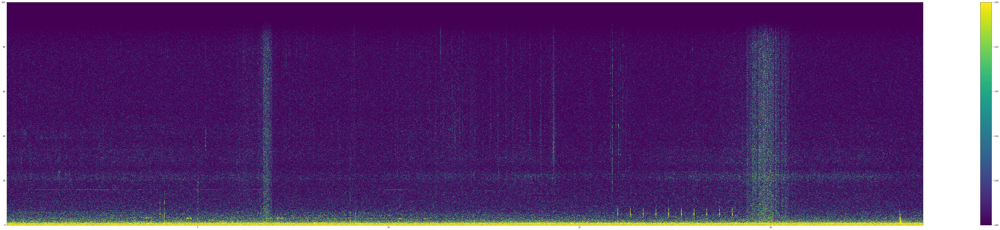

In [18]:
fig = plt.figure(figsize=(100,20))
plt.pcolormesh(time_vec, freq_vec, 10*np.log10(Pxx), shading='auto',vmin=-160, vmax=-150)
plt.colorbar()
plt.show()

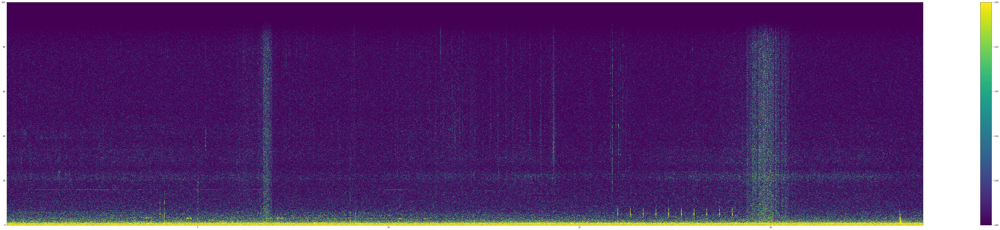

In [8]:
fig = plt.figure(figsize=(100,20))
plt.pcolormesh(time_vec, freq_vec, 10*np.log10(Pxx), shading='auto',vmin=-160, vmax=-150)
plt.colorbar()
plt.show()

(0.0, 1.0)

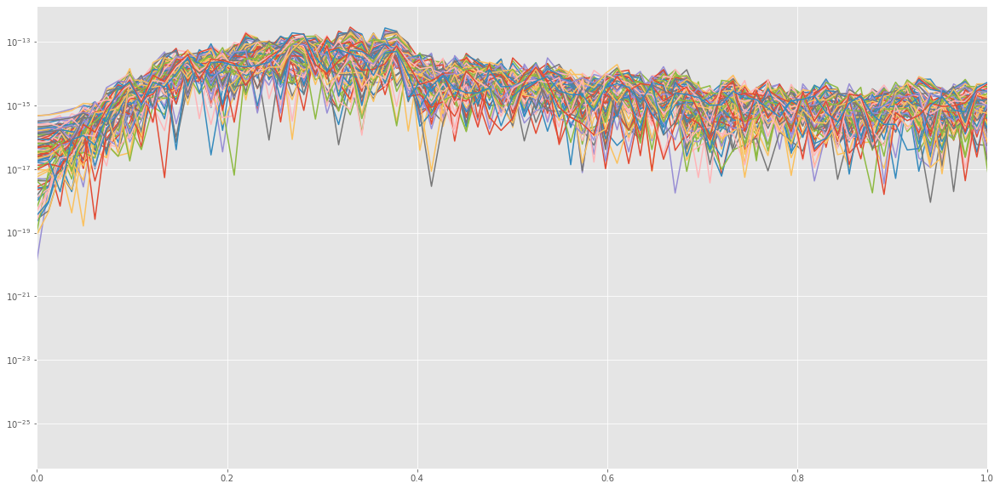

In [24]:
plt.style.use('ggplot')
plt.figure(figsize=(20,10))
for Pxx_den in Pxx.T[300:400,:]:
    plt.semilogy(freq_vec, Pxx_den)
    
#plt.semilogy(freq, scipyP, 'r')
plt.xlim(0,1)

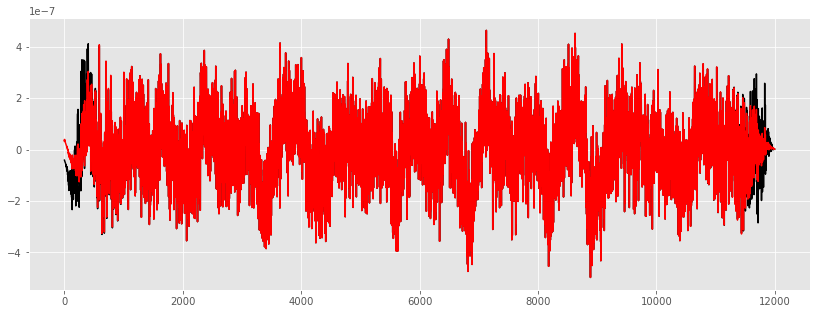

In [71]:
plt.style.use('ggplot')
plt.figure(figsize=(14,5))
tr = read('BC.1001.01.BHZ.D.20180080108000000.sac.cut.vel.bp')[0]
plt.plot(x_seg, 'k')
plt.plot(tr.data, 'r')

In [133]:
import math
2**math.ceil(math.log(8000)/math.log(2))

8192